In [2]:
; Welcome to a Jupyter notebook!


In [3]:
; Why are we in a Jupyter notebook?
; 
; We will be learning, editing, and running code in this notebook.


In [4]:
; What is Jupyter?
;
; Computational Notebook (notebooks for code)


In [5]:
; What can you do in a Jupyter notebook?
; 
; - look at code
; - edit the code
; - run the code
; - look at the results of running the code


In [6]:
; Because it is a computational notebook things are not hidden from you
;
; So in addition to reading notes and code you sometimes have to run cells
;
; You run cells by pressing ctrl-enter or (on a Mac) cmd-enter 


In [7]:
; put your cursor in this cell and run it by pressing ctrl-enter
(ql:quickload "april") 
(ql:quickload "opticl")
(ql:quickload "drakma")
(ql:quickload "alexandria")
(ql:quickload "skippy")
(defpackage :image-filtering 
  (:nicknames :im)
  (:use :common-lisp :april :opticl :drakma :alexandria))
(in-package :im)
(load "utils.lisp")
; you have to run this cell in order to use April


To load "april":
  Load 1 ASDF system:
    april

; Loading "april"
To load "array-operations":
  Load 2 ASDF systems:
    asdf let-plus
  Install 1 Quicklisp release:
    array-operations
##########################################################################

; Loading "array-operations"
[package array-operations/generic]................
[package array-operations/reducing]...............
[package array-operations/matrices]...............
[package array-operations/utilities]..............
[package array-operations/creating]...............
[package array-operations/indexing]...............
[package array-operations/displacing].............
[package array-operations/transforming]...........
[package array-operations/stacking].
To load "april":
  Load 1 ASDF system:
    april

; Loading "april"
To load "prove":
  Load 5 ASDF systems:
    alexandria asdf cl-ppcre let-plus uiop
  Install 4 Quicklisp releases:
    cl-ansi-text cl-colors cl-colors2 prove
##################################

[package com.gigamonkeys.binary-data].............
[package com.gigamonkeys.binary-data.common-datatypes].
..................................................
[package ieee-floats].............................
[package jpeg]...Performing compile-time optimization.. please wait.
Done.
.................................
[package deflate].................................
[package opticl-core].............................
[package opticl-cltl2]............................
[package retrospectiff.constants].................
[package retrospectiff.globals]...................
[package retrospectiff.binary-types]..............
[package retrospectiff.util]......................
[package retrospectiff.bit-array].................
[package retrospectiff.compression]...............
[package retrospectiff.image].....................
[package retrospectiff.ifd].......................
[package retrospectiff]...........................
[package retrospectiff2]..........................
[package salza2]...

("april")

("opticl")

("drakma")

("alexandria")

("skippy")

#<PACKAGE "IMAGE-FILTERING">

#<PACKAGE "IMAGE-FILTERING">

T


; Loading "skippy"

[SIMPLE-WARNING] undefined variable: IMAGE-FILTERING::*LOOK-AT-IMAGE*
[SB-INT:SIMPLE-STYLE-WARNING] undefined function: IMAGE-FILTERING::FORCE-SMALL
[SB-INT:SIMPLE-STYLE-WARNING] undefined function: IMAGE-FILTERING::WRITE-ARRAY
[SB-INT:SIMPLE-STYLE-WARNING] undefined function: IMAGE-FILTERING::WRITE-ARRAY-AS-PNG
[SIMPLE-WARNING] undefined variable: IMAGE-FILTERING::*LOOK-AT-IMAGE*
[SIMPLE-WARNING] undefined variable: IMAGE-FILTERING::*LOOK-AT-IMAGE*
[SB-INT:SIMPLE-STYLE-WARNING] The variable &REST is defined but never used.
[SB-INT:SIMPLE-STYLE-WARNING] The variable B is defined but never used.
[SB-INT:SIMPLE-STYLE-WARNING] The variable IMAGES is defined but never used.
[SIMPLE-WARNING] undefined variable: IMAGE-FILTERING::*LOOK-AT-IMAGE*


In [8]:
; - Goals for this class
;
; - Errors will happen often
;
; - Ask me to walk through things
;
; - Use paper and pencil
;
; - Start with a small version of the problem
; 
; - Make changes in the notebook!
;   - Add cells and change existing cells
;
; - Learning
;   - if you want to learn about, for example, ⊂
;     go to tryapl.org and type: ]help ⊂
;   - Dyalog APL Tutor
;     - https://tutorial.dyalog.com/
;
; - Use APL regularly
;   - Instead of using a calculator for math homework use APL!
;
; - Ask questions and discuss
;   - The APL Orchard is a friendly place ask questions about APL 
;     - https://apl.chat/


In [9]:
; What is APL?
;
;   "A Programming Language"


In [10]:
; APL (the langauge)
;
;    rules   (syntax)
;    and
;    meaning (semantics)
;


In [11]:
; APLs (the versions)
; 
; Some APLs include:
;   Dyalog APL, GNU APL, and April APL


In [12]:
; We are using April!


In [13]:
; You can try Dyalog here: 
; https://tryapl.org/


In [14]:
; APL is a general purpose programming langauge but it happens to be
; really good at working with images


In [15]:
; What are images?


In [16]:
; Is this an image?
(april-f "0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 1 0 0")


#(0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 1 0 0)

0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 1 0 0


In [17]:
; ...about April
; notice the -f
;
; think about the -f as meaning "friendly" output


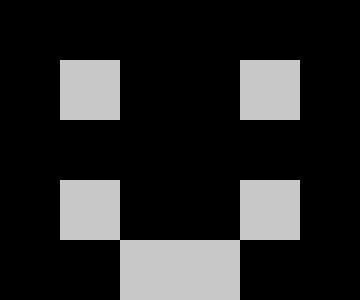

0   0   0   0   0 0
0 200   0   0 200 0
0   0   0   0   0 0
0 200   0   0 200 0
0   0 200 200   0 0


In [18]:
; Image Representation
(write-array (april-f "200 × 5 6 ⍴ 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 1 0 0"))


In [19]:
(april "smile←200 × 5 6 ⍴ 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 1 0 0")


#2A((0 0 0 0 0 0)
    (0 200 0 0 200 0)
    (0 0 0 0 0 0)
    (0 200 0 0 200 0)
    (0 0 200 200 0 0))

In [20]:
; Because images are represented as numbers we need some math to work with them


In [21]:
; In APL, most math symbols do what you would expect them to do
;
; = + - ÷ × etc.


In [22]:
; APL is a small language


In [23]:
; How small?


In [24]:
; In order to see the APL symbols we need to load some javascript in your browser
; 
; This is usually done in the "Console" often found in "Developer Tools"


In [ ]:
var script = document.createElement ("script");
script.src = "https://abrudz.github.io/lb/lb.js";
document.body.appendChild (script);


UNBOUND-VARIABLE: The variable VAR is unbound.

UNBOUND-VARIABLE: The variable SCRIPT is unbound.

UNBOUND-VARIABLE: The variable = is unbound.

UNBOUND-VARIABLE: The variable DOCUMENT.CREATEELEMENT is unbound.

COMPILED-PROGRAM-ERROR: Execution of a form compiled with errors.
Form:
  ("script")
Compile-time error:
  illegal function call

UNBOUND-VARIABLE: The variable SCRIPT.SRC is unbound.

UNBOUND-VARIABLE: The variable = is unbound.

"https://abrudz.github.io/lb/lb.js"

UNBOUND-VARIABLE: The variable DOCUMENT.BODY.APPENDCHILD is unbound.

UNDEFINED-FUNCTION: The function IMAGE-FILTERING::SCRIPT is undefined.

[SB-INT:SIMPLE-STYLE-WARNING] undefined function: IMAGE-FILTERING::SCRIPT


The variable VAR is unbound.
   [Condition of type UNBOUND-VARIABLE]

#<ENVIRONMENT {100799CD63}>
   [Environment of thread #<THREAD "SHELL Thread" RUNNING {10015702A3}>]


Backtrace:
 5: (SB-KERNEL::%SIGNAL The variable VAR is unbound.)
 6: (ERROR The variable VAR is unbound.)
 7: (SB-KERNEL:WITH-SIMPLE-CONDITION-RESTARTS ERROR NIL The variable VAR is unbound.)
 8: ((LABELS SB-KERNEL::TRY :IN SB-KERNEL::RESTART-UNBOUND) The variable VAR is unbound.)
 9: (SB-KERNEL::RESTART-UNBOUND VAR The variable VAR is unbound. -21623)
 10: (SB-KERNEL:INTERNAL-ERROR #.(SB-SYS:INT-SAP #X7FB4998FDC80) #<unused argument>)
 11: ("foreign function: call_into_lisp")
 12: ("foreign function: funcall2")
 13: ("foreign function: handle_trap")
 14: ("foreign function: #x41796E")
 15: (SB-INT:SIMPLE-EVAL-IN-LEXENV VAR #<NULL-LEXENV>)
 16: (EVAL VAR)
 17: (COMMON-LISP-JUPYTER::MY-EVAL VAR)
 18: ((:METHOD JUPYTER:EVALUATE-CODE (COMMON-LISP-JUPYTER:KERNEL T)) #<unused argument> var script = document.createElement

In [26]:
; APL is designed to be mnemonic
; 
; : assisting or intended to assist memory 


In [27]:
; Behind every image on a computer there are just numbers
;
; For this class those numbers are: 0 through 255
; 
; 0   is black
; 255 is white
; 
; What number represents gray?
;
; This is called "greyscale"


In [28]:
; What is a pixel?
;  : PIcture ELement


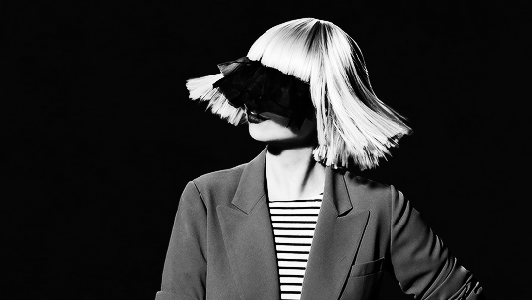

In [29]:
; let's look at some pixels
;
; first we need an image
(read-png "images/sia.png")


In [30]:
; after you execute (read-png) a greyscale copy of your image
; is in April as "img"


In [31]:
; let's look at the size of it now using ⍴
(april "⍴ img")


#(300 532)

In [32]:
; let's look at a single pixel
(april "img[200;230]")
; the 200th row
; the 230th column


62

In [33]:
; let's look at one row of pixels
(april "img[1;]")


#(6 6 6 5 5 5 5 6 6 6 6 6 6 6 6 6 6 6 6 6 5 6 5 6 6 6 6 6 6 5 5 5 5 5 5 5 5 5 6
  6 6 6 6 6 6 6 6 6 6 6 6 6 6 5 5 5 5 5 5 5 5 5 5 5 5 5 6 5 5 5 5 5 5 5 5 5 5 5
  4 5 4 5 5 5 6 5 5 5 5 5 6 6 6 6 5 5 5 5 5 5 6 6 6 6 6 6 7 6 6 6 6 6 6 6 6 6 6
  6 6 6 6 6 6 6 6 7 6 6 6 6 6 6 6 6 6 6 6 6 5 5 5 5 6 6 5 5 4 4 4 4 4 4 5 5 5 5
  5 5 6 6 6 5 5 5 5 5 5 5 5 5 6 6 6 6 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 6 6 6
  6 7 6 6 6 5 5 5 6 6 7 6 6 7 6 6 5 5 5 5 6 6 7 6 6 6 6 6 6 7 7 6 5 6 5 5 5 5 5
  5 5 6 5 5 5 5 5 5 5 5 5 5 5 6 6 5 5 5 5 4 4 4 4 4 4 4 4 4 4 4 4 5 6 5 5 5 5 5
  5 6 6 5 5 5 5 5 5 5 5 6 6 5 5 5 5 5 5 4 4 5 5 5 5 4 4 5 5 5 5 5 5 5 6 5 5 5 5
  5 5 5 6 5 5 5 5 5 5 4 4 5 5 5 5 5 5 5 5 6 6 6 6 5 5 6 6 6 6 6 6 5 6 5 5 5 4 5
  5 5 6 6 5 5 5 5 6 5 5 5 5 5 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
  4 4 4 4 4 4 4 4 4 5 5 5 6 6 6 6 5 5 5 5 5 5 5 5 5 5 5 5 5 5 4 4 4 4 4 4 5 5 5
  5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 6 4 4 4 4 4 4 4 4 4 5 5 5 6 5 5 4 5 5
  4 4 4 4 4 4 4 4 4 4 5 5 5 5 5 4 4 4 5 

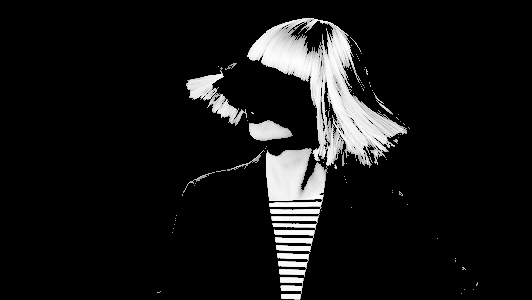

In [34]:
; let's modify the image by only keeping pixel values
; greater than 150
(write-array (april "img × img > 150"))


In [35]:
; Terms
;
; We need to learn some words used in APL


In [36]:
; Scalar
(april "3")


3

In [37]:
; Vector
(april "2 4 6 8")


#(2 4 6 8)

In [38]:
; Matrix a.k.a "array"  a.k.a "grid"


In [39]:
(april-f "4 4 ⍴ 1 2 3" )


#2A((1 2 3 1) (2 3 1 2) (3 1 2 3) (1 2 3 1))

1 2 3 1
2 3 1 2
3 1 2 3
1 2 3 1


In [40]:
; Function and Operands:
(april "8 - 3")
; - is the function
; 8 is the function's left operand
; 3 is the function's right operand


5

In [41]:
; Monadic Function


In [42]:
(april "÷ 9")
; mon-  mono-
; : one : single : alone 
;
; monadic functions take a single operand


1/9

In [43]:
; Dyadic Function


In [44]:
(april "4 + 6")
; dyad
; : pair
;
; dyadic functions take two operands


10

In [45]:
; Please Excuse My Dear Aunt Sally?


In [46]:
; Order of Operations in APL:
; 
; right to left
; and
; the space between vectors items are strong!
;
; but you can use parentheses to force an order
; 


In [47]:
; right to left
(april "10 ÷ 2 + 3")


2

[SB-INT:SIMPLE-STYLE-WARNING] The variable #:G3 is defined but never used.


In [48]:
; parens force order
(april "(10 ÷ 2) + 3")


8

[SB-INT:SIMPLE-STYLE-WARNING] The variable #:G3 is defined but never used.


In [49]:
; the space between vectors items are strong
(april "10 + 1 2 3")


#(11 12 13)

In [50]:
(april "(10 + 1) 2 3")


#(11 2 3)

In [51]:
; ⍴ is a greek letter 
; pronounced "row" 
; spelled "rho"
;
; dyadic  ⍴ is the "reshape" function
; monadic ⍴ is the "shape"   function


In [52]:
; "what is the shape of the 4 4 reshape of 1 2 3"
(april  "⍴4 4 ⍴ 1 2 3" )


#(4 4)

In [53]:
; "what is the shape of the shape of the 4 4 reshape of 1 2 3"
(april "⍴⍴4 4 ⍴ 1 2 3" )


#(2)

In [54]:
; we need to spend some time with the reshape function
;   let's do it a little later


In [55]:
; Dimensions, Rank, Shape


In [56]:
; spaces don't matter between functions and their operands
(april "⍴ 3")


#()

In [57]:
(april "⍴3")


#()

In [58]:
(april "⍴ 2 4 6 8")


#(4)

In [59]:
(april "⍴2 4 6 8")


#(4)

In [60]:
(april "(⍴ 2 4) 6 8")


#(#(2) 6 8)

In [61]:
(april "⍴⍴ 2 4 6 8")


#(1)

In [62]:
; Let's generate some random images


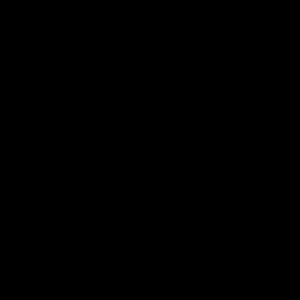

In [63]:
; first an image with all black pixels
(write-array (april "10 10 ⍴ 0"))


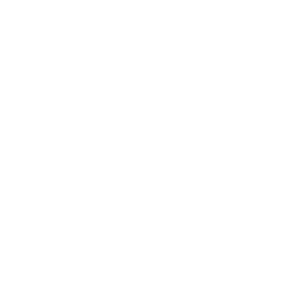

In [64]:
; an image with all white pixels
(write-array (april "10 10 ⍴ 255"))


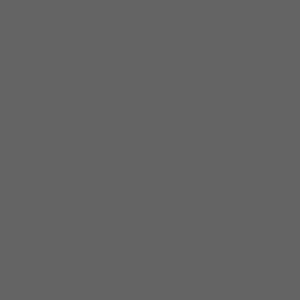

In [65]:
; an image with all grey pixels
(write-array (april "10 10 ⍴ 100"))


In [66]:
; ?
; roll


In [67]:
(april "?255")


55

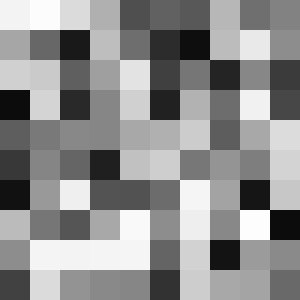

In [68]:
; a 10 by 10 pixel image with random pixel values
(write-array (april "?10 10 ⍴ 255"))


In [69]:
; You might hear me use these terms:


In [70]:
; Nested


In [71]:
; Item


In [72]:
; Axis


In [73]:
; Functions and Operators


In [74]:
; ←
; assignment function


In [75]:
(april "sam ← 50 100 200")


#(50 100 200)

In [76]:
(april "sam")


#(50 100 200)

In [77]:
; what do you think this will do?
(april "sam ÷ 2")


#(25 50 100)

In [78]:
; ⍳ "iota"
; index generator function


In [79]:
(april "⍳9")


#(1 2 3 4 5 6 7 8 9)

In [80]:
; ⍴  "rho"
; shape of function
; monadic ⍴ tells you the shape of something


In [81]:
(april "⍴ 2 4 6 8 10")


#(5)

In [82]:
(april "⍴ sam")


#(3)

In [83]:
; dyadic ⍴ reshapes
(april "15 ⍴ sam")
; Read as: "15 reshape sam" makes a vector 15 items long using sam


#(50 100 200 50 100 200 50 100 200 50 100 200 50 100 200)

In [84]:
; ≢
; tally function


In [85]:
; Let's look it up 
; go to tryapl.org and type: ]help ≢


In [86]:
; ⍉
; Transpose function


In [87]:
(april "twenty_five_square ← 5 5 ⍴ ⍳ 25")


#2A((1 2 3 4 5) (6 7 8 9 10) (11 12 13 14 15) (16 17 18 19 20) (21 22 23 24 25))

In [88]:
(april-f "⍉ twenty_five_square")


#2A((1 6 11 16 21) (2 7 12 17 22) (3 8 13 18 23) (4 9 14 19 24) (5 10 15 20 25))

1  6 11 16 21
2  7 12 17 22
3  8 13 18 23
4  9 14 19 24
5 10 15 20 25


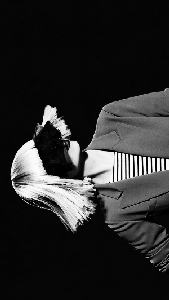

In [89]:
; let's transpose the image of sia
(write-array (april "⍉ img"))


In [90]:
; transpose two times?


In [91]:
; ,  comma
; dyadic , is the catenate function
; monadic , is the ravel function


In [92]:
(april "20 30 40 , sam")


#(20 30 40 50 100 200)

In [93]:
(april "20 30 40 sam")


#(20 30 40 #(50 100 200))

In [94]:
(april ", smile")


#(0 0 0 0 0 0 0 200 0 0 200 0 0 0 0 0 0 0 0 200 0 0 200 0 0 0 200 200 0 0)

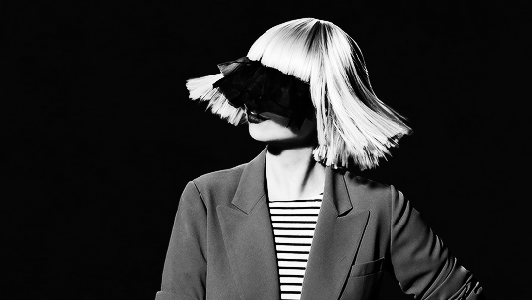

In [95]:
; let's make a mask
(write-array (april "img"))


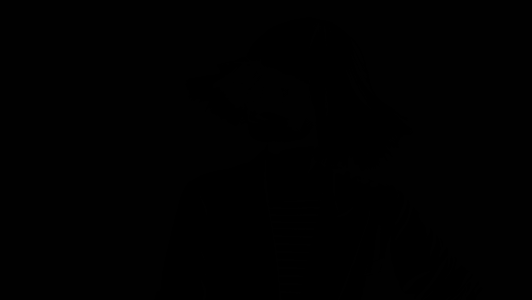

In [96]:
(write-array (april "mask ← img < 20"))


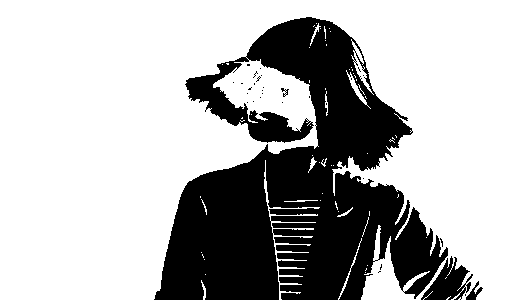

In [97]:
(write-array (april "mask × 255"))


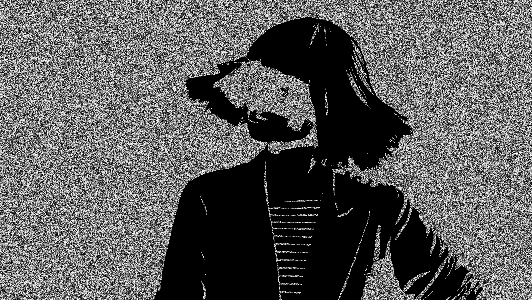

In [98]:
; and use the mask
(write-array (april "one ← mask × ?(⍴img) ⍴ 255"))


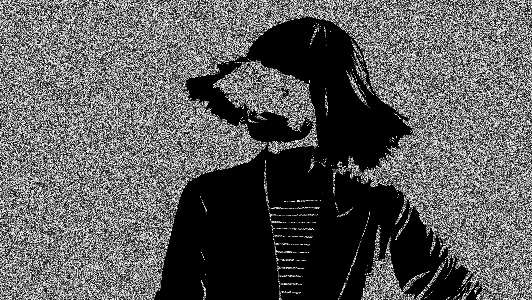

In [99]:
(write-array (april "two ← mask × ?(⍴img) ⍴ 255"))


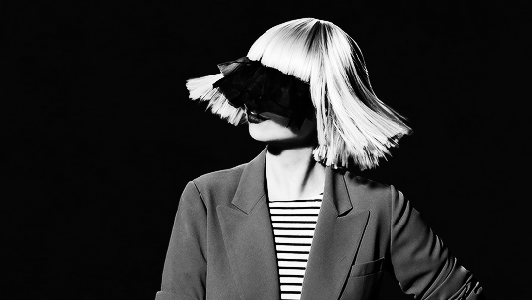

In [100]:
(write-animated-gif (april "img one two"))


In [101]:
; animation with masks


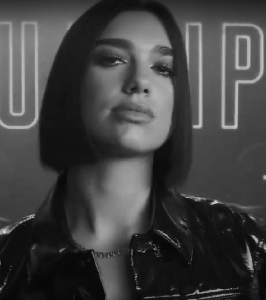

In [102]:
(read-png "images/Dua_Lipa.png")


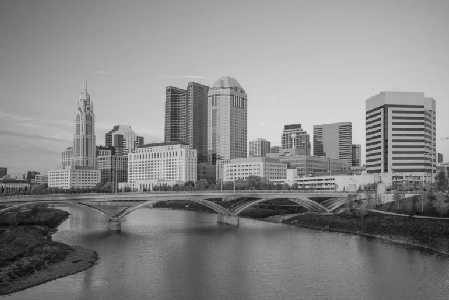

In [103]:
(read-png "images/Columbus-Skyline.png")


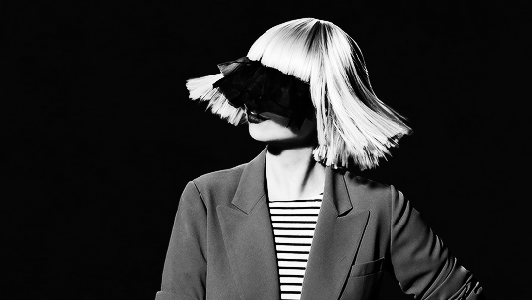

In [104]:
(read-png "images/sia.png")


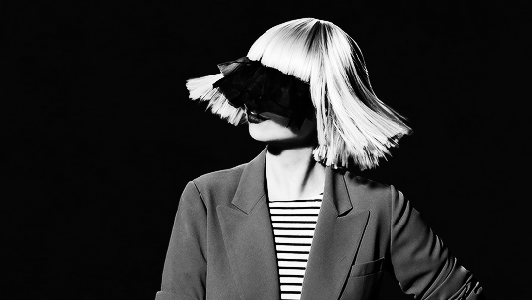

In [105]:
(write-array (april "img"))


In [106]:
(april "masks ← ( ⊂ img ) < 20 40 60 40")


#(#2A((1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1

In [107]:
(april "numberSteps ← 20")


20

In [108]:
(april "stepSize ← ⌈ 255 ÷ numberSteps")


13

In [109]:
(april "stepSequence ← ⌽ stepSize × ⍳ numberSteps")


#(260 247 234 221 208 195 182 169 156 143 130 117 104 91 78 65 52 39 26 13)

In [110]:
(april "masks ← ( ⊂ img ) < stepSequence ")


#(#2A((1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
       1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1

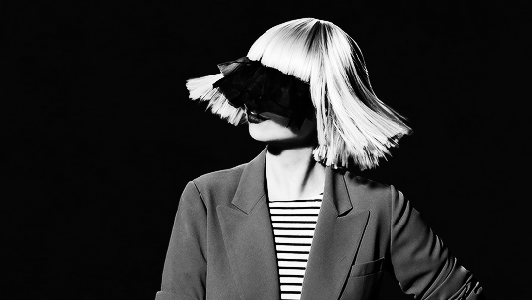

In [111]:
(write-animated-gif (april "masks × ⊂ img"))
; try to delete the ⊂ in this cell 


In [112]:
; function definition
; {}


In [113]:
(april "15 {⍺+⍵} 10 20 30")


#(25 35 45)

In [114]:
(april "15 {⍺<⍵} 10 20 30")


#(0 1 1)

In [115]:
(april-f "{3 3 ⍴ ⍵} ⍳10")


#2A((1 2 3) (4 5 6) (7 8 9))

1 2 3
4 5 6
7 8 9


In [116]:
; ⎕
; look


In [117]:
(april "⎕← 8 7 6" )


#(8 7 6)

8 7 6


In [118]:
; ⋄
; end of expression


In [119]:
(april "1 ⋄ 2" )


2

In [120]:
(april "⎕←1 ⋄ 2" )


2

1


In [121]:
(april "⎕←1 ⋄ 2 ⋄ 99" )


99

1


In [122]:
; [ ]
; indexing


In [123]:
(april "m←3 3 ⍴ ⍳ 9")


#2A((1 2 3) (4 5 6) (7 8 9))

In [124]:
(april "m[1;]")


#(1 2 3)

In [125]:
(april "(4 4 ⍴ ⍳ 16) [1;]")


#(1 2 3 4)

In [126]:
; +/
; plus reduce
; plus "plop"


In [127]:
(april "+/1 3 5 7")


16

In [128]:
(april "sam ← 10 20 30")


#(10 20 30)

In [129]:
(april "+/sam")


60

In [130]:
; ×/
; multiply reduce
; muitiply "plop"


In [131]:
(april "×/1 3 5 7")


105

In [132]:
(april "sam ← 10 20 30")


#(10 20 30)

In [133]:
(april "×/sam")


6000

In [134]:
; ⌈
; (monadic) round up
; (dyadic) maximum


In [135]:
(april "⌈4.2")


5

In [136]:
(april "9⌈8")


9

In [137]:
; ⌊


In [138]:
(april "⌊4.2")


4

In [139]:
(april "2.5⌊4.2")


2.5d0

In [140]:
; |
; remainder


In [141]:
(april "5|10")
; 10 divided by 5 is 2 and the remainder is 0


0

In [142]:
(april "5|9")
; 9 divided by 5 is 1 and the remainder is 4


4

In [143]:
; some rotations, flips, etc.


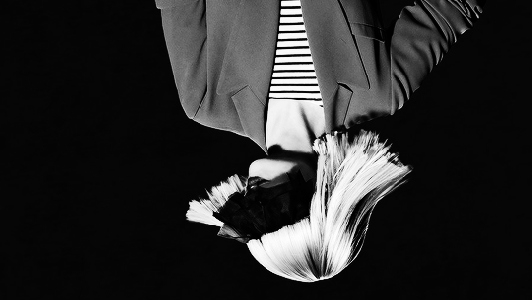

In [144]:
(write-array (april "⊖img"))


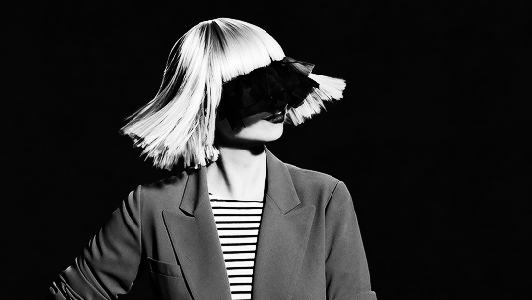

In [145]:
(write-array (april "⌽img"))


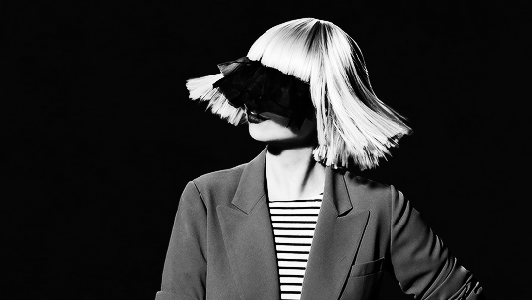

In [146]:
(write-animated-gif (april "img (⌽img) (⊖img)"))


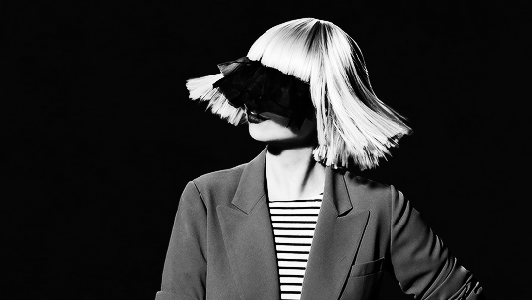

In [147]:
(write-animated-gif (april "img (100⌽img)"))


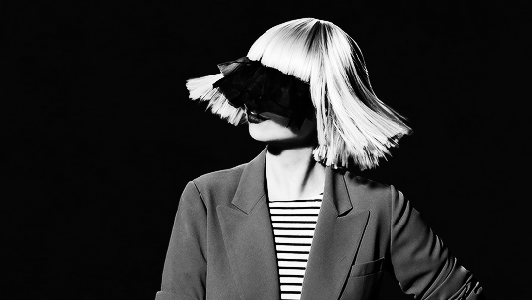

In [148]:
(write-animated-gif (april "img (100⌽img)"))


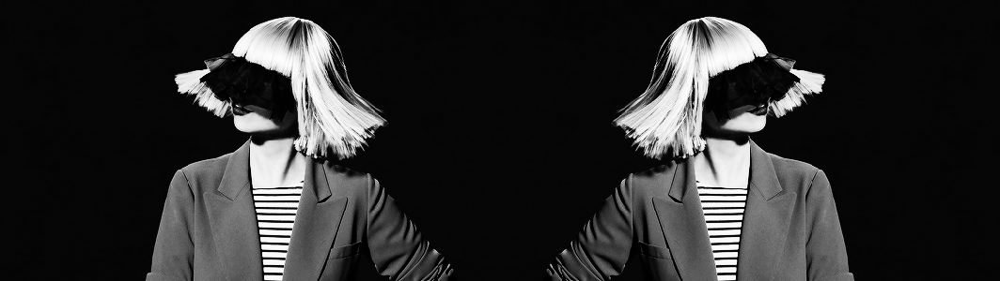

In [149]:
(write-array (april "img,⌽img"))


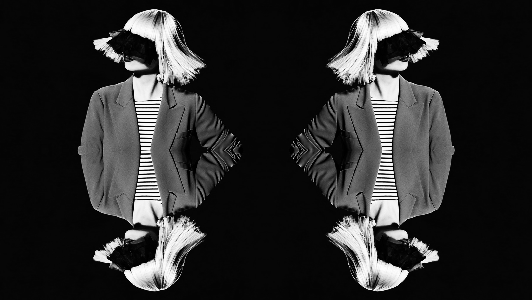

In [150]:
(write-array (april "{⍵,[1]⊖⍵}img,⌽img"))


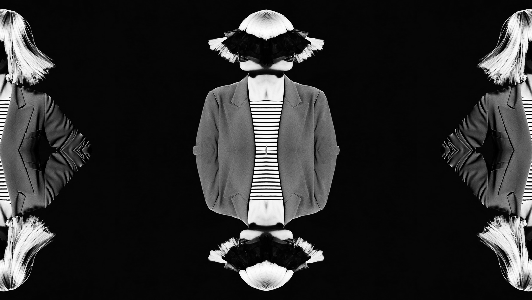

In [151]:
(write-array (april "{⍵,[1]⊖⍵} (¯230⌽img),230⌽⌽img"))


In [152]:
; convolution kernels
; using the stencil function:  ⌺


In [153]:
(april "⎕ ← m ← 4 4 ⍴ ⍳ 25")


#2A((1 2 3 4) (5 6 7 8) (9 10 11 12) (13 14 15 16))

 1  2  3  4
 5  6  7  8
 9 10 11 12
13 14 15 16


In [154]:
(april-f "({⍵}⌺ 3 3) m")


#4A((((0 0 0) (0 1 2) (0 5 6))
     ((0 0 0) (1 2 3) (5 6 7))
     ((0 0 0) (2 3 4) (6 7 8))
     ((0 0 0) (3 4 0) (7 8 0)))
    (((0 1 2) (0 5 6) (0 9 10))
     ((1 2 3) (5 6 7) (9 10 11))
     ((2 3 4) (6 7 8) (10 11 12))
     ((3 4 0) (7 8 0) (11 12 0)))
    (((0 5 6) (0 9 10) (0 13 14))
     ((5 6 7) (9 10 11) (13 14 15))
     ((6 7 8) (10 11 12) (14 15 16))
     ((7 8 0) (11 12 0) (15 16 0)))
    (((0 9 10) (0 13 14) (0 0 0))
     ((9 10 11) (13 14 15) (0 0 0))
     ((10 11 12) (14 15 16) (0 0 0))
     ((11 12 0) (15 16 0) (0 0 0))))

 0  0  0
 0  1  2
 0  5  6
        
 0  0  0
 1  2  3
 5  6  7
        
 0  0  0
 2  3  4
 6  7  8
        
 0  0  0
 3  4  0
 7  8  0
        
        
 0  1  2
 0  5  6
 0  9 10
        
 1  2  3
 5  6  7
 9 10 11
        
 2  3  4
 6  7  8
10 11 12
        
 3  4  0
 7  8  0
11 12  0
        
        
 0  5  6
 0  9 10
 0 13 14
        
 5  6  7
 9 10 11
13 14 15
        
 6  7  8
10 11 12
14 15 16
        
 7  8  0
11 12  0
15 16  0
        
        
 0  9 10
 0 13 14
 0  0  0
        
 9 10 11
13 14 15
 0  0  0
        
10 11 12
14 15 16
 0  0  0
        
11 12  0
15 16  0
 0  0  0


In [155]:
(april-f "({+/,⍵}⌺ 3 3) m") ; adding up all cells in each matrix


#2A((14 24 30 22) (33 54 63 45) (57 90 99 69) (46 72 78 54))

14 24 30 22
33 54 63 45
57 90 99 69
46 72 78 54


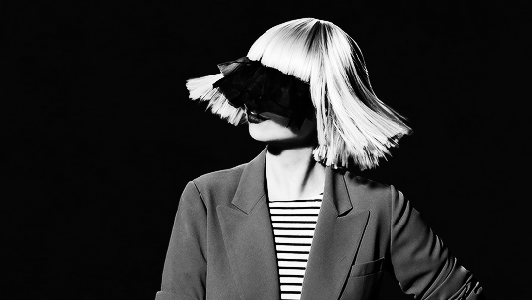

In [156]:
(write-array (april "img"))


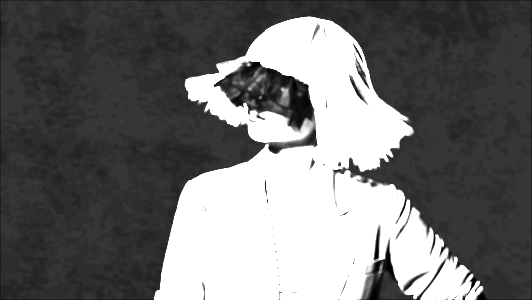

24 36 34 32 30 30 32 34 36 36 36 36 36 36 36 36 36 36 35 34 33 33 33 34 35 36 36 36 34 32 30 30 30 31 31 31 30 31 32 33 33 33 34 35 36 36 36 36 36 36 36 36 34 32 30 30 30 30 30 31 31 31 30 31 31 33 33 33 32 31 31 30 30 30 30 30 30 28 27 26 28 30 31 33 32 32 30 30 30 32 34 36 36 34 32 31 31 31 31 33 35 36 36 36 37 37 37 35 35 34 35 35 35 35 35 36 36 36 36 36 36 36 36 37 37 37 36 36 36 36 36 36 36 36 36 36 36 35 33 31 30 31 33 33 32 28 26 24 25 26 27 28 28 30  30  31  30  31  33  35  34  32  30  30  30  30  30  30  30  32  34  36  36  35  34  33  33  33  33  32  31  32  34  36  36  36  36  36  36  36  36  36  36  36  35  37  37  37  34  32  31  30  32  35  37  37  36  36  36  36  34  32  31  31  32  32  35  36  37  36  36  36  36  37  38  37  35  33  33  33  33  33  33  32  32  32  33  32  31  30  30  30  30  30  30  30  30  32  34  34  32  30  30  28  26  24  24  24  24  24  24  24  24  24  24  26  28  31  32  33  33  33  33  33  33  32  31  30  30  30  30  30  30  31  33  34  33  31  3

In [157]:
; adding up all cells in each matrix 
; then reduce to 255 if greater (clamping)
(write-array (april-f "255⌊({+/,⍵}⌺ 3 3) img"))


In [158]:
; sharpen kernel
(april "⎕←kernel←3 3 ⍴ 0 ¯1 0 ¯1 5 ¯1 0 ¯1 0")


#2A((0 -1 0) (-1 5 -1) (0 -1 0))

 0 ¯1  0
¯1  5 ¯1
 0 ¯1  0


In [159]:
(april-f "result←({+/+/kernel×⍵}⌺ 3 3) img ⋄ 0")


0

0

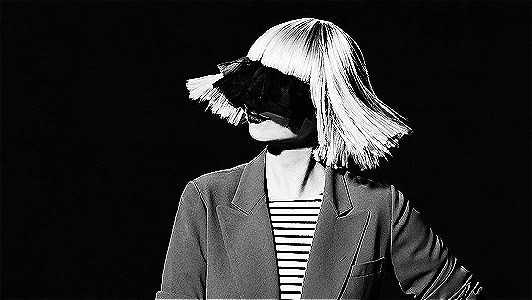

In [160]:
(write-array (april "0⌈255⌊result"))


In [161]:
; let's sharpen a few times then animate


In [162]:
(april-f "result1←({+/+/kernel×⍵}⌺ 3 3) (225⌊result) ⋄ 0")


0

0

In [163]:
(april-f "result2←({+/+/kernel×⍵}⌺ 3 3) (225⌊result1) ⋄ 0")


0

0

In [164]:
(april-f "result3←({+/+/kernel×⍵}⌺ 3 3) (225⌊result2) ⋄ 0")


0

0

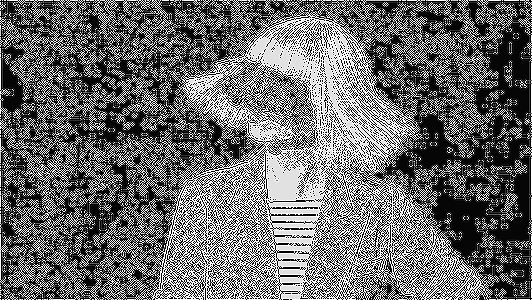

In [165]:
; first, look at the final result 
(write-array (april "0⌈255⌊result3"))


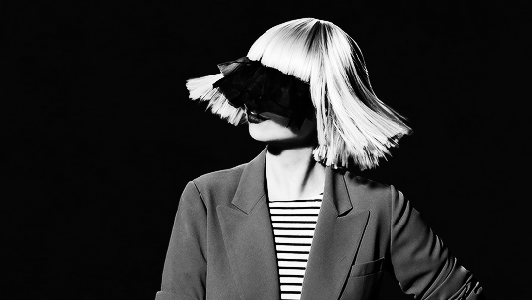

In [166]:
(write-animated-gif (april "img (0⌈255⌊result) (0⌈255⌊result1) (0⌈255⌊result2)")) 


In [167]:
; line detection


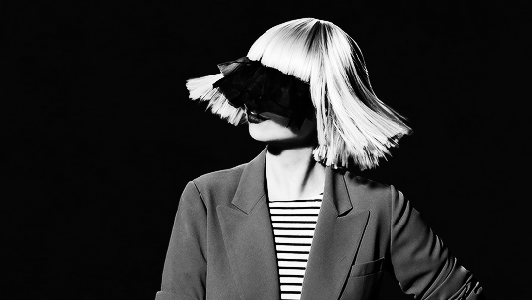

In [168]:
(write-array (april "img"))


In [169]:
(april "⎕←kernel←3 3 ⍴ ¯1 2 ¯1 ")


#2A((-1 2 -1) (-1 2 -1) (-1 2 -1))

¯1 2 ¯1
¯1 2 ¯1
¯1 2 ¯1


In [170]:
(april "done←({0⌈255⌊+/,⍵×kernel}⌺ 3 3) img ⋄ 0")


0

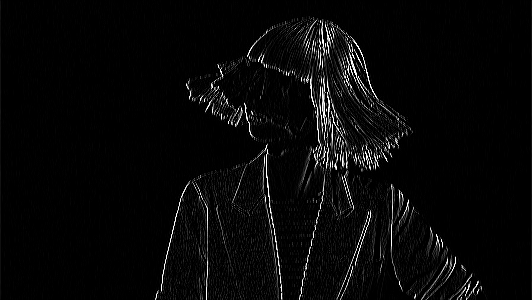

In [171]:
(write-array (april "done"))


In [172]:
; guassian blur in a function


In [173]:
(april "gaussBlur←{kernel←3 3 ⍴ 1 2 1 2 4 2 1 2 1
                   ({255⌊0⌈⌊(+/,kernel × ⍵)÷16}⌺ 3 3) ⍵
                  }")


#<FUNCTION (LABELS APRIL::∇SELF) {534C65BB}>

In [174]:
(april-f "gaussBlur 3 3 ⍴ ⍳9")


#2A((1 2 2) (3 5 4) (3 5 4))

1 2 2
3 5 4
3 5 4


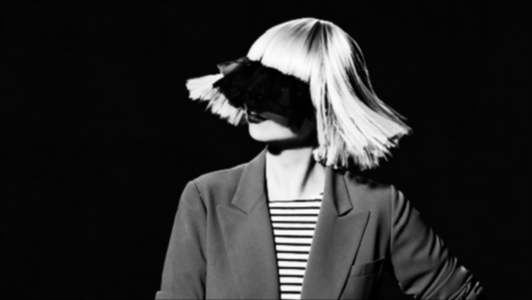

3 4 4 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 3 3 3 3 3 4 4 4 4 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 4 4 3 3 3 3 3 3 3 3 3 3  3  3   3   3   4   4   4   3   3   3   3   3   3   3   3   3   4   4   4   4   4   4   4   4   4   3   3   3   4   4   4   4   4   4   4   4   4   4   4   4   4   4   4   4   4   4   3   3   3   4   4   4   4   4   4   4   4   3   3   3   3   4   4   4   4   4   4   4   4   4   4   4   4   4   4   4   4   4   4   3   3   4   4   4   3   3   3   3   3   3   3   3   3   3   4   4   3   3   3   3   3   3   3   3   3   3   3   3   3   3   3   3   3   3   4   4   4   4   4   4   4   4   3   3   3   3   3   3   3   3   4   4   4   3   3   3   3   3   3   3   3   3   3   3   3   3   3   3   3   3   3   3   3   4   3   3   3   3   3   3   3   4   3   3   3   3   3   3   3   3   3   3   3   

In [175]:
(write-array (april-f "gaussBlur img"))


In [176]:
; apply it twice


In [177]:
;;;;;;;;;


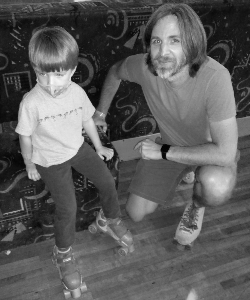

[PNGLOAD::CHUNK-NOT-IMPLEMENTED] Extension chunk type not implemented: "eXIf" (101 88 73 102) in stream: NIL.


In [178]:
(read-png "images/twitter_photo1_sm.png")


In [179]:
; how many pixel values are greater than 50?


In [180]:
; how many pixel are there? 


In [181]:
; what percentage of pixel values are greater than 50? 
(april "⌊100×(+/,img>50)÷×/⍴img")


75

In [182]:
; what color occurs most often?
(april "{⍺ (≢⍵)}⌸ ,img")


#2A((68 526)
    (69 517)
    (62 402)
    (66 476)
    (65 506)
    (64 455)
    (72 609)
    (61 441)
    (74 590)
    (70 539)
    (76 657)
    (77 677)
    (81 652)
    (79 718)
    (71 559)
    (67 495)
    (84 687)
    (73 617)
    (78 691)
    (80 743)
    (83 662)
    (85 714)
    (75 633)
    (82 718)
    (92 740)
    (103 698)
    (111 512)
    (117 349)
    (115 422)
    (113 494)
    (100 776)
    (99 739)
    (105 611)
    (109 524)
    (132 209)
    (186 116)
    (217 153)
    (220 209)
    (219 168)
    (216 138)
    (211 111)
    (206 128)
    (204 91)
    (200 105)
    (181 131)
    (173 136)
    (165 170)
    (158 181)
    (149 184)
    (124 220)
    (106 579)
    (102 728)
    (101 715)
    (95 744)
    (98 800)
    (91 750)
    (89 748)
    (90 740)
    (55 333)
    (114 443)
    (116 369)
    (94 783)
    (51 311)
    (56 327)
    (60 379)
    (59 378)
    (47 339)
    (57 366)
    (52 329)
    (63 441)
    (96 808)
    (93 733)
    (46 335)
    (49 319)
    (53 32

In [183]:
(april "⎕←kernelA←3 3 ⍴ ¯1 2 ¯1 ")


#2A((-1 2 -1) (-1 2 -1) (-1 2 -1))

¯1 2 ¯1
¯1 2 ¯1
¯1 2 ¯1


In [184]:
(april "up←img×img>100")


#2A((0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
     0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 103 111 117 115 113 0 0
     0 105 105 109 132 186 217 220 219 216 216 211 211 206 204 200 181 173 173
     165 158 149 124 106 102 109 105 101 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
     0 114 116 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
     0 0 0 0 0 0 0 0 0 113 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
     0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
     0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0)
    (0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
     0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 101 115 113 104 109 103
     0 0 106 111 111 129 173 215 212 210 179 165 154 155 154 137 121 0 0 103
     107 0 0 0 101 0 0 102 108 0 111 108 119 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
     114 104 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

In [185]:
(april "r←({255⌊|+/+/kernelA×⍵}⌺3 3) gaussBlur up ⋄ 0")


0

In [186]:
(april "r←({255⌊|+/+/kernelA×⍵}⌺3 3) img ⋄ 0")


0

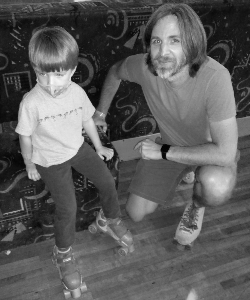

In [187]:
(write-animated-gif (april "img r"))


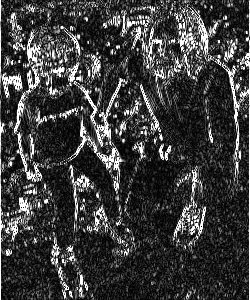

In [188]:
(write-array (april "255⌊⌈3.0×r"))


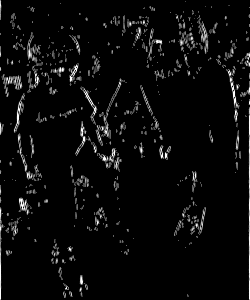

In [189]:
(write-array (april "r×(gaussBlur r)>50"))


In [190]:
;;;;
; https://web.archive.org/web/20121005005358/http://williamson-labs.com/convolution-2d.htm


In [191]:
; high pass mask


In [192]:
(time (april "kern←3 3 ⍴ ¯1 ¯1 ¯1 ¯1 9 
       r←{+/,kern × ⍵}⌺ 3 3 ⊢ img ⋄ 0"))


0


Evaluation took:
  5.256 seconds of real time
  39.310734 seconds of total run time (38.170956 user, 1.139778 system)
  [ Run times consist of 0.053 seconds GC time, and 39.258 seconds non-GC time. ]
  747.93% CPU
  12,058,876,678 processor cycles
  400,566,256 bytes consed
  


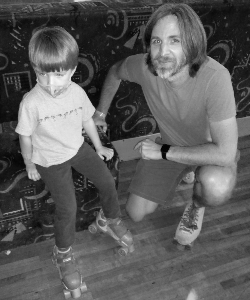

In [193]:
(write-animated-gif (april "(img) (0⌈255⌊r)"))


In [194]:
; low pass filter


In [195]:
(april-f "kern←3 3 ⍴ (4 ⍴ ÷16),(÷2)")


#2A((1/16 1/16 1/16) (1/16 1/2 1/16) (1/16 1/16 1/16))

In [196]:
(time (april "r←{+/,kern × ⍵}⌺ 3 3 ⊢ img ⋄ 0"))


0


Evaluation took:
  8.840 seconds of real time
  64.289185 seconds of total run time (63.569662 user, 0.719523 system)
  [ Run times consist of 0.062 seconds GC time, and 64.228 seconds non-GC time. ]
  727.25% CPU
  20,296,199,419 processor cycles
  431,063,328 bytes consed
  


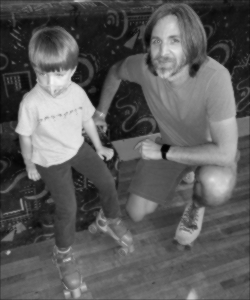

In [197]:
(write-array (april "⌊0⌈255⌊r"))


In [198]:
(time (april "rr←{+/,kern × ⍵}⌺ 3 3 ⊢ r ⋄ 0"))


0


Evaluation took:
  10.420 seconds of real time
  75.032321 seconds of total run time (74.217328 user, 0.814993 system)
  [ Run times consist of 0.072 seconds GC time, and 74.961 seconds non-GC time. ]
  720.08% CPU
  23,915,109,970 processor cycles
  433,959,248 bytes consed
  


In [199]:
(time (april "rrr←{+/,kern × ⍵}⌺ 3 3 ⊢ rr ⋄ 0"))


0


Evaluation took:
  11.472 seconds of real time
  82.310024 seconds of total run time (81.758230 user, 0.551794 system)
  [ Run times consist of 0.060 seconds GC time, and 82.251 seconds non-GC time. ]
  717.49% CPU
  26,328,328,919 processor cycles
  434,179,536 bytes consed
  


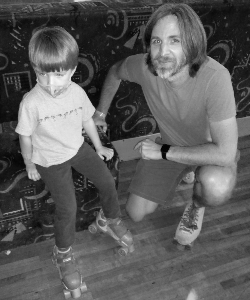

In [200]:
(write-animated-gif (april "(img) (⌊0⌈255⌊r) (⌊0⌈255⌊rr) (⌊0⌈255⌊rrr)"))


In [201]:
;edge detector


In [202]:
(april-f "kern←3 3 ⍴ ¯1 ¯1 ¯1 ¯1 8")


#2A((-1 -1 -1) (-1 8 -1) (-1 -1 -1))

In [203]:
(april "r_edge←{+/,kern × ⍵}⌺ 3 3 ⊢ img ⋄ 0")


0

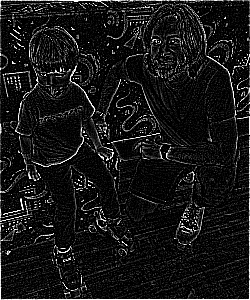

In [204]:
(write-array (april "⌊255⌊0⌈r_edge"))


In [ ]:
(write-array (april "(⊢×(200∘<)) (255⌊0⌈r)"))


TYPE-ERROR: The value
  1631/8
is not of type
  (UNSIGNED-BYTE 8)
when setting an element of (ARRAY (UNSIGNED-BYTE 8))

The value
  1631/8
is not of type
  (UNSIGNED-BYTE 8)
when setting an element of (ARRAY (UNSIGNED-BYTE 8))
   [Condition of type TYPE-ERROR]

#<ENVIRONMENT {1009E55F13}>
   [Environment of thread #<THREAD "SHELL Thread" RUNNING {1001580123}>]


Backtrace:
 5: (SB-KERNEL::%SIGNAL The value 1631/8 is not of type (UNSIGNED-BYTE 8) when setting an element of (ARRAY (UNSIGNED-BYTE 8)))
 6: (ERROR TYPE-ERROR DATUM 1631/8 EXPECTED-TYPE (UNSIGNED-BYTE 8) CONTEXT AREF)
 7: (SB-KERNEL:INTERNAL-ERROR #.(SB-SYS:INT-SAP #X7FB4998FD940) #<unused argument>)
 8: ("foreign function: call_into_lisp")
 9: ("foreign function: funcall2")
 10: ("foreign function: handle_trap")
 11: ("foreign function: #x41796E")
 12: ((SB-VM::OPTIMIZED-DATA-VECTOR-SET (UNSIGNED-BYTE 8)) #<unavailable argument> #<unavailable argument> #<unavailable argument>)
 13: ((LABELS SB-IMPL::FROB :IN SB-KERNEL:FILL-DATA-VECTOR) 2 NIL 1631/8)
 14: ((LABELS SB-IMPL::FROB :IN SB-KERNEL:FILL-DATA-VECTOR) 1 (250) (0 0 0 0 0 0 0 0 0 0 0 0 0

In [206]:
(april "{+/,(3 3 ⍴ ¯1 ¯1 ¯1 ¯1 9) × ⍵}⌺ 3 3 ⊢ img")


#2A((403 286 215 287 266 267 247 282 306 234 200 326 253 255 257 321 257 220
     326 295 332 316 249 256 264 308 289 267 302 288 278 228 398 260 267 325
     244 296 258 277 341 272 290 239 258 240 294 265 360 286 290 269 345 359
     254 242 246 221 321 303 344 382 424 450 495 479 486 376 390 392 425 403
     393 480 808 947 907 934 955 1019 998 1019 993 1018 1062 940 905 909 845
     808 773 573 443 420 490 434 402 340 376 324 345 349 310 402 410 345 332
     309 239 346 259 134 226 295 291 420 418 525 528 330 278 289 248 238 272
     203 165 296 150 150 356 317 357 195 150 168 271 238 231 186 200 194 189
     316 325 250 317 237 309 277 312 254 270 256 217 236 326 395 402 364 526
     381 248 205 275 170 185 340 280 189 140 235 336 297 266 227 161 177 237 89
     263 264 266 301 297 209 321 309 197 312 386 283 280 401 349 240 211 187
     199 232 209 327 302 155 210 160 196 210 184 236 168 211 224 192 295 325
     359 242 222 243 246 252 285 148 64 64 102 179 227 190 122 312 335 18

In [207]:
(april-f "3 3 ⍴ ¯1 ¯1 ¯1 ¯1 9 ")


#2A((-1 -1 -1) (-1 9 -1) (-1 -1 -1))

¯1 ¯1 ¯1
¯1  9 ¯1
¯1 ¯1 ¯1


In [208]:
; ⌸ key


In [209]:
(april "⎕←m←5 5 ⍴ ⍳20")


#2A((1 2 3 4 5) (6 7 8 9 10) (11 12 13 14 15) (16 17 18 19 20) (1 2 3 4 5))

 1  2  3  4  5
 6  7  8  9 10
11 12 13 14 15
16 17 18 19 20
 1  2  3  4  5


In [210]:
(april-f "{⍺ (≢⍵)}⌸ ,m")


#2A((1 2)
    (2 2)
    (3 2)
    (4 2)
    (5 2)
    (6 1)
    (7 1)
    (8 1)
    (9 1)
    (10 1)
    (11 1)
    (12 1)
    (13 1)
    (14 1)
    (15 1)
    (16 1)
    (17 1)
    (18 1)
    (19 1)
    (20 1))

 1 2
 2 2
 3 2
 4 2
 5 2
 6 1
 7 1
 8 1
 9 1
10 1
11 1
12 1
13 1
14 1
15 1
16 1
17 1
18 1
19 1
20 1


In [211]:
(progn
  (april "m←img")
  ; (april "m←smile")
  ; (april "m←⌊(+/img)÷¯1↑⍴img")
  (april "res←{⍺,≢⍵} ⌸ ,m")
  (april-f "sorted←res[⍋⌽res;]")
  ; (april-f "sorted←res[⍒res;]")
  (april "values←sorted[⍳1⊃⍴sorted;1]")
  (april "counts←sorted[⍳1⊃⍴sorted;2]")
  0)


0

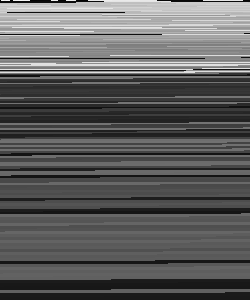

In [212]:
(write-array (april "(⍴m) ⍴ counts/values"))


#2A((0 -1 0) (-1 5 -1) (0 -1 0))

#2A((340/3 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170
     170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170
     170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170
     170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170
     170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170
     170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170
     170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170
     170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170
     170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170
     170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170
     170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170
     170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170
     170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 170 1

#<CLOSURE (LAMBDA (APRIL::OMEGA) :IN APRIL::OPERATE-STENCILING) {1001586C3B}>

TYPE-ERROR: The value
  340/3
is not of type
  (UNSIGNED-BYTE 8)
when setting an element of (ARRAY (UNSIGNED-BYTE 8))

5

#*10011

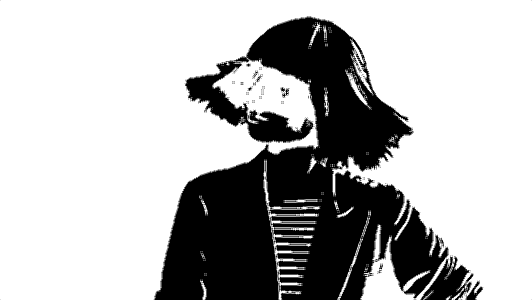

 0 ¯1  0
¯1  5 ¯1
 0 ¯1  0


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
; blur the result?
(april-f "⊢kernel←3 3 ⍴ 0 ¯1 0 ¯1 5 ¯1 0 ¯1 0")
(april "res←{(+/÷≢),⍵}⌺3 3⊢mask×255")
(april "boxBlur←{(⌊+/÷≢),⍵}⌺3 3")
(write-array (april "res"))
(april "(+/÷≢),3 3 ⍴ ⍳9")
(april "'APPLE'∊13↑⎕a")
(write-array (april "{0⌈255⌊+/,kernel×⍵}⌺3 3⊢⌊res"))


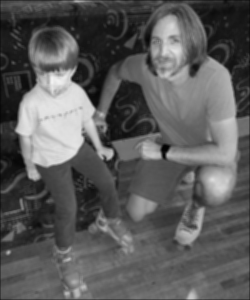

In [214]:
(write-array (april "boxBlur img"))


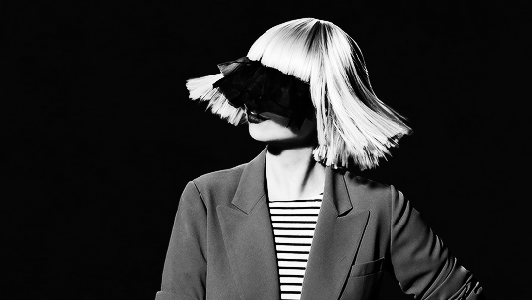

#<FUNCTION (LABELS APRIL::∇SELF) {534CA18B}>

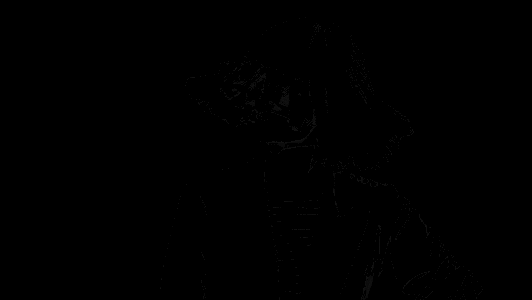

In [215]:
(read-png "images/sia.png")
(april "f←{⍵ × (⍺ < ⍵) ∧ ((⍺+10) > ⍵)}")
(write-animated-gif (april "((10×⍳24),(⌽(10×⍳24))) f (⊂img)") 5)